<a href="https://colab.research.google.com/github/stefanogiagu/corso_AI_2024/blob/main/notebooks/es5/MetodiAI_Fis2024_Es5_PCA_tSNE_UMAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Esercitazione 5: algoritmi per la visualizzazione di campioni multivariati e riduzione dimensionale

**Task:** Scopo: familiarizzare con l'implementazione di algoritmi di riduzione dimensionale (PCA, tSNE, UMAP) usando i package scikit-learn e umap-learn

**Dataset:**

MNIST: benchmark dataset costituito da immagini di caratteri numerici scritti a mano ([wikipedia](https://en.wikipedia.org/wiki/MNIST_database), [Y. LeCun Original web page](http://yann.lecun.com/exdb/mnist/))

Ising2D: vedere precedente esercitazione [link](https://github.com/stefanogiagu/corso_AI_2023/tree/main/notebooks/es4)

In [11]:
# scarica dataset Ising2D
!rm -rf ising_conf.dat.gz
!rm -rf ising_conf.dat
!rm -rf ising_label.dat.gz
!rm -rf ising_label.dat
!wget http://giagu.web.cern.ch/giagu/CERN/ising_conf.dat.gz
!wget http://giagu.web.cern.ch/giagu/CERN/ising_label.dat.gz
!gunzip ising_conf.dat.gz
!gunzip ising_label.dat.gz

"rm" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.
"rm" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.
"rm" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.
"rm" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.
"wget" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.
"wget" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.
"gunzip" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.
"gunzip" non Š riconosciuto come comando interno o esterno,
 un programma eseguibile o un file batch.


In [12]:
# legge dataset Ising2D
import numpy as np

#leggiamo le configurazioni ising dal file usando numpy (25k esempi oguno da 28x28 spin)
X_ising = np.loadtxt('ising_conf.dat')
X_ising = X_ising.reshape(25000,28*28)
print('X_ising shape: ',X_ising.shape)

#leggiamo da file le label associate:
T_ising = np.loadtxt('ising_label.dat')
print('T_ising shape: ',T_ising.shape)

ord_sele = (T_ising < 2.0)
cri_sele = ((T_ising >= 2.0) & (T_ising <= 2.5))
dis_sele = (T_ising > 2.5)

Y_ising = np.zeros(shape=T_ising.shape)
Y_ising[ord_sele]=0
Y_ising[cri_sele]=1
Y_ising[dis_sele]=2

print('Y_ising shape: ',Y_ising.shape)

X_ising shape:  (25000, 784)
T_ising shape:  (25000,)
Y_ising shape:  (25000,)


In [13]:
#scarica e legge dataset MNIST from openml (https://openml.org/)
from sklearn.datasets import fetch_openml

X_mnist, Y_mnist = fetch_openml("mnist_784", version=1, return_X_y=True, as_frame=False, parser="pandas")
X_mnist_2d = X_mnist.reshape(X_mnist.shape[0], 28, 28)

print(X_mnist.shape)
print(X_mnist_2d.shape)
print(Y_mnist.shape)
Y_mnist = Y_mnist.astype(int)

(70000, 784)
(70000, 28, 28)
(70000,)


**Parte 1:**

Analisi PCA: campione Ising2D

1.   implementare un'analisi a componenti prncipali (PCA) usando la libreria sklearn:

`from sklearn.decomposition import PCA`

2.   printare il valore della varianza spiegata per le prime 10 componenti PCA

3.   graficare lo scatter plot delle prime due componenti principali in due plot distinti: uno in cui ogni configurazione viene colorata in accordo al valore della temeperatura, e un secondo in cui ogni configurazione viene colorata in accordo ad una delle tre clasi *(0,1,2)* corrispondenti alle configurazioni ordinate, critiche e disordinate, rispettivamente.

4.   graficare lo scatter plot della prima componente principale in funzione della magnetizzazione media calcolata nell'esercitazione precedente. Cosa se ne deduce?

Explained variance comp. 1 -> 0.36692223272715735
Explained variance comp. 2 -> 0.020684599425635473
Explained variance comp. 3 -> 0.01979491232477253
Explained variance comp. 4 -> 0.019665792216264764
Explained variance comp. 5 -> 0.01920186524968242
Explained variance comp. 6 -> 0.005148917590449874
Explained variance comp. 7 -> 0.005003065451098566
Explained variance comp. 8 -> 0.004945135138544341
Explained variance comp. 9 -> 0.004901480639641384
Explained variance comp. 10 -> 0.004783323236149796
Sum of explained varianca for 10 components -> 0.47105132399939653


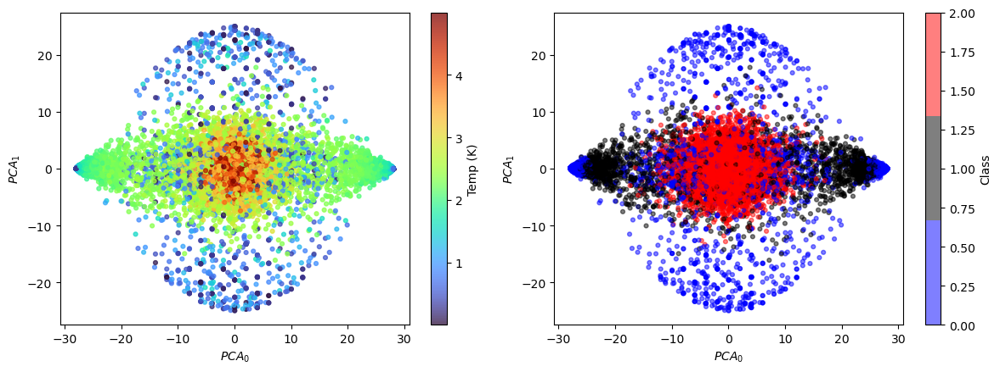

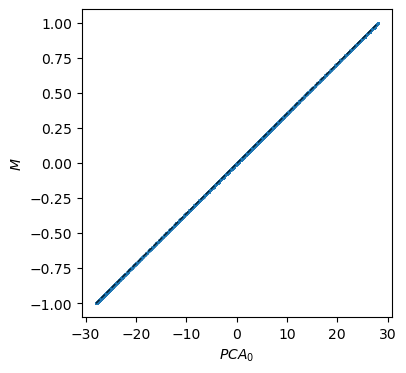

In [14]:
#code
from sklearn.decomposition import PCA
from matplotlib import colors
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure as pltfigure

pca = PCA(10)
X_ising_pca = pca.fit_transform(X_ising)
pca_var = pca.explained_variance_ratio_

for i in range(0, len(pca_var)):
    print(f"Explained variance comp. {i+1} -> {pca_var[i]}")
print(f"Sum of explained varianca for {i+1} components -> {pca_var.sum()}")

cmap = colors.ListedColormap(['blue', 'black', 'red'])

plt.figure(figsize=(12, 4.5))
plt.subplot(1,2,1)
sc1 = plt.scatter(X_ising_pca[:,0], X_ising_pca[:,1], c=T_ising, cmap='turbo', alpha=0.75, s=12)
plt.colorbar(sc1, label='Temp (K)')
plt.xlabel("${PCA}_0$")
plt.ylabel("${PCA}_1$")

plt.subplot(1,2,2)
sc2 = plt.scatter(X_ising_pca[:,0], X_ising_pca[:,1], c=Y_ising, cmap=cmap, alpha=0.5, s=12)
plt.colorbar(sc2, label='Class')
plt.xlabel("${PCA}_0$")
plt.ylabel("${PCA}_1$")

plt.tight_layout()
plt.show()

plt.figure(figsize=(4, 4))
avg_M = np.sum(X_ising, axis=1)/X_ising.shape[1]
plt.scatter(X_ising_pca[:,0], avg_M, s=1, alpha=0.5)
plt.plot([X_ising_pca[:,0].min(), X_ising_pca[:,0].max()], [-1,1], '--',  color="black", alpha=0.75, linewidth=1)
plt.xlabel("${PCA}_0$")
plt.ylabel("$M$")
plt.show()

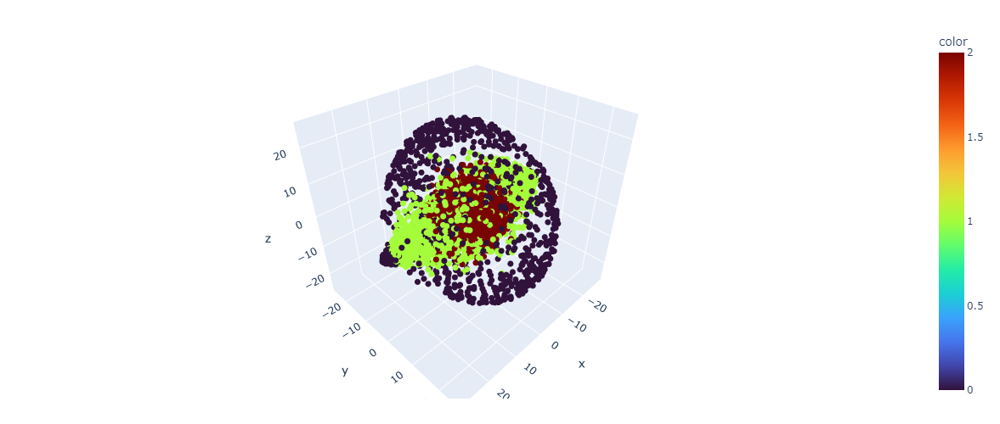

In [15]:
import plotly.express as px

fig = px.scatter_3d(x = X_ising_pca[:,0], y = X_ising_pca[:,1], z = X_ising_pca[:,2], color=Y_ising, color_continuous_scale='turbo')
fig.update_traces(marker=dict(size=4))
fig.update_layout(
    autosize=False,
    width=600,
    height=500,
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30,
        pad=4
    ),
    paper_bgcolor="white",
)

fig.show()

In [16]:
#@title Soluzione 1.1 e 1.2

from sklearn.decomposition import PCA

#NOTA: prima di applicare la PCA è importante normalizzare le feature in modo che abbiano
# varianze simili. Nel caso specifico del campione Ising2D non è necessario farlo
# perché i valori di ogni spin (pixel) sono già compresi tra -1 e 1 per costruzione

# istanzio una PCA con 10 componenti
pca = PCA(n_components=10)

# calcolo la trasformazione PCA su i dati di input (fit) e contestualmente la applico
# ai dati stessi (fit_transform)
pca_result = pca.fit_transform(X_ising)


# varianza spiegata (è un vettore corrispondente alle n_componewents)
exp_var = pca.explained_variance_ratio_

for i in range(0,len(exp_var)):
  print('explained variance componente: ',i, ' = ', exp_var[i])
print('Explained variance totale delle prime 10 componenti della PCA: {}'.format(sum(exp_var)))

#NOTA: l'explained variance indica quanto ciascuna componente contribusice alla varianza totale del campione
# si osserva come la prima componente risulta di gran lunga più infromativa delle altre nel spiegare la varianza
# del campione



explained variance componente:  0  =  0.36692223272715735
explained variance componente:  1  =  0.020684599425635473
explained variance componente:  2  =  0.01979491232477253
explained variance componente:  3  =  0.019665792216264764
explained variance componente:  4  =  0.01920186524968242
explained variance componente:  5  =  0.005148917590449874
explained variance componente:  6  =  0.005003065451098566
explained variance componente:  7  =  0.004945135138544341
explained variance componente:  8  =  0.004901480639641384
explained variance componente:  9  =  0.004783323236149796
Explained variance totale delle prime 10 componenti della PCA: 0.47105132399939653


In [17]:
#@title Soluzione 1.3

import matplotlib.pyplot as plt
%matplotlib inline

# grafico PCA
# pca_results prodotto da fit_transform è un array numpy di dimensione (numero eventi, n_components)
# che conteiene il valore delle n_components della PCA

# plottiamo la prima componente vs la seconda

#colorando i punti in accordo alla temperatura T_ising
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.scatter(pca_result[:,0], pca_result[:,1], c=T_ising, cmap='hot')
cbar = plt.colorbar()
cbar.set_label('Temperature')
plt.xlabel('$PCA_0$')
plt.ylabel('$PCA_1$')
# e in accordo alla label Y_ising
plt.subplot(1,2,2)
plt.scatter(pca_result[:,0], pca_result[:,1], c=Y_ising, cmap='tab10')
cbar = plt.colorbar()
cbar.set_label('Classe')
plt.xlabel('$PCA_0$')
plt.ylabel('$PCA_1$')
plt.tight_layout()

In [18]:
#@title Soluzione 1.4

# calcolo magnetizzazione media
M_ising = np.sum(X_ising, axis=1)/X_ising.shape[1]

plt.scatter(pca_result[:,0], M_ising, s=0.1)
plt.plot([-30,30],[-1,1], color='black', linewidth=1, linestyle='dashed')
plt.xlabel('$PCA_0$')
plt.ylabel('$M$');

# la prima componente principale corrisponde alla magnetizzazione media dei campioni
# (in effetti il modello di ising2D dipende da un unico parametro d'ordine che descrive
# la transizione di fase ordine-disordine, rappresentato proprio dalla agnetizzazione del sistema).

**Parte 2:**

Analisi PCA: campione MNIST

0.   normalizzare le immagini in [0,1] e graficare le prime 16 immagini mnist

1.   implementare un'analisi a componenti prncipali (PCA) usando la libreria sklearn sul campione MNIST

2.   printare il valore della varianza spiegata per le prime 10 componenti PCA

3.   graficare lo scatter plot delle prime due componenti principali in cui ogni configurazione viene colorata in accordo al valore della label di classe Y_mnist (0,1,2,3,...,9)

4.   applicare la trasformzione inversa PCA per tornare nello spazio originale alle prime 10 componenti principali, e graficare le prime 16 immagini mnist confrontandole con le immagini originali ... cosa è cambiato? Perché?
Riprovare usando 2 componenti principali, cosa cambia? Quante componenti sono necessarie per avere una ricostruzione in cui i caratteri siano percepibili?

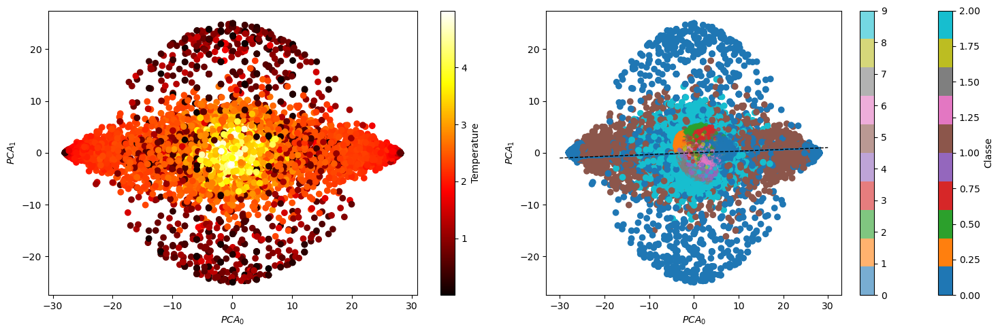

In [19]:

# normalizzo
X_mnist = (X_mnist - X_mnist.min()) / (X_mnist.max() - X_mnist.min())

pca = PCA(50)
X_mnist_pca = pca.fit_transform(X_mnist)
#pca_var = pca.explained_variance_ratio_

#pca_var = (pca_var - pca_var.min()) / (pca_var.max() - pca_var.min()) * 100
#for i in range(0, len(pca_var)):
#    print(f"Explained variance comp. {i+1} -> {pca_var[i]:.1f}%")

plt.scatter(X_mnist_pca[:,0], X_mnist_pca[:,1], c=Y_mnist, cmap='tab10', alpha=0.6, s=12)
plt.colorbar()
plt.xlabel("${PCA}_0$")
plt.ylabel("${PCA}_1$")
plt.show()

In [20]:
import plotly.express as px

fig = px.scatter_3d(x = X_mnist_pca[:,0], y = X_mnist_pca[:,1], z = X_mnist_pca[:,2], color=Y_mnist, color_continuous_scale=px.colors.qualitative.D3)
fig.update_traces(marker=dict(size=2))
fig.update_layout(
    autosize=False,
    width=600,
    height=500,
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30,
        pad=4
    ),
    paper_bgcolor="white",
)

fig.show()

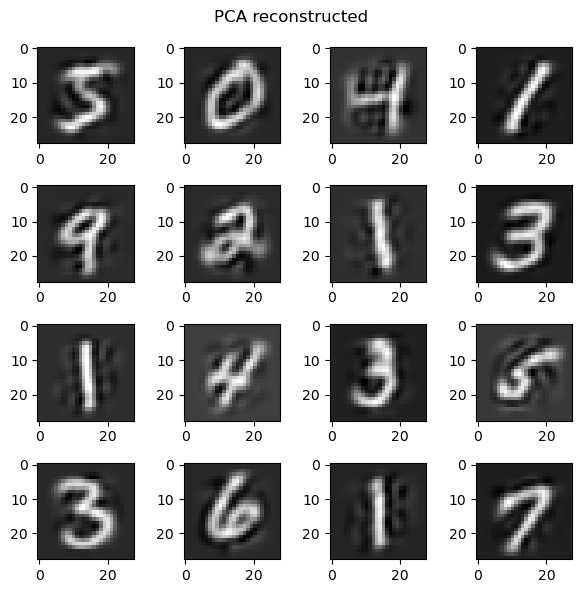

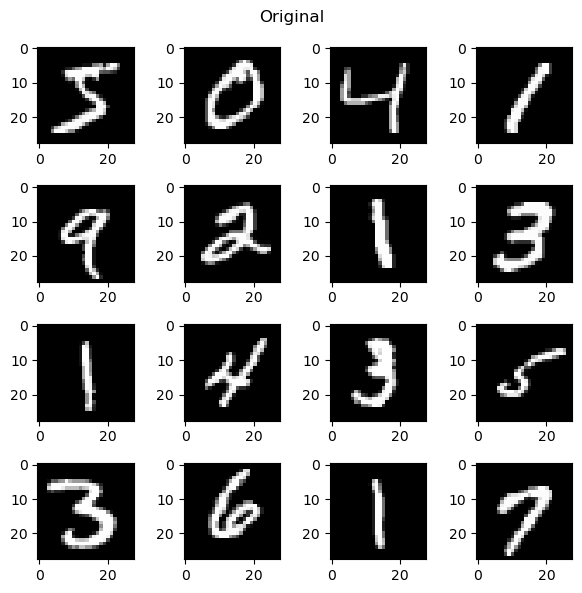

In [21]:
X_mnist_inv_pca = pca.inverse_transform(X_mnist_pca)
X_mnist_inv_pca_2d = X_mnist_inv_pca.reshape(X_mnist_inv_pca.shape[0], 28, 28)

fig = plt.figure(figsize=(6, 6))
fig.suptitle("PCA reconstructed")
for i in range(0,16):
    plt.subplot(4,4,i+1)
    plt.imshow(X_mnist_inv_pca_2d[i], cmap='gray')
plt.tight_layout()
plt.show()

fig = plt.figure(figsize=(6, 6))
fig.suptitle("Original")
for i in range(0,16):
    plt.subplot(4,4,i+1)
    plt.imshow(X_mnist_2d[i], cmap='gray')
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

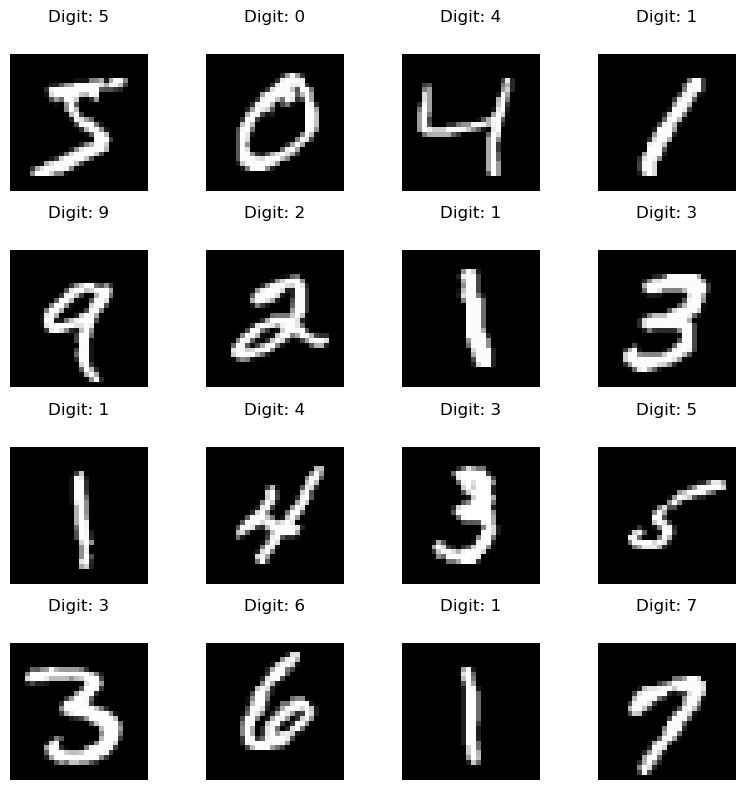

In [22]:
#@title Soluzione 2.0

# normalizzazione

#NOTA: prima di applicare la PCA è importante normalizzare le feature in modo che abbiano
# varianze simili. Nel caso specifico del campione Ising2D non è necessario farlo
# perché i valori di ogni spin (pixel) sono già compresi tra -1 e 1 per costruzione

X_mnist = X_mnist/256.

import matplotlib.pyplot as plt
plt.gray()
fig = plt.figure( figsize=(8,8) )

for i in range(0,16):
  ax = fig.add_subplot(4,4,i+1, title='Digit: {}'.format(str(Y_mnist[i])))
  ax.matshow(X_mnist[i].reshape(28,28).astype(float))
  plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
#@title Soluzione 2.1-2.2-2.3

from sklearn.decomposition import PCA

pca2 = PCA(n_components=10)

pca2_result = pca2.fit_transform(X_mnist)

exp_var2 = pca2.explained_variance_ratio_

for i in range(0,len(exp_var2)):
  print('explained variance componente: ',i, ' = ', exp_var2[i])
print('Explained variance totale delle prime 10 componenti della PCA: {}'.format(sum(exp_var2)))

import matplotlib.pyplot as plt
plt.figure(figsize=(7,5))
plt.scatter(pca2_result[:,0], pca2_result[:,1], c=Y_mnist, cmap='tab10')
cbar = plt.colorbar()
cbar.set_label('Classe')
plt.xlabel('$PCA_0$')
plt.ylabel('$PCA_1$')

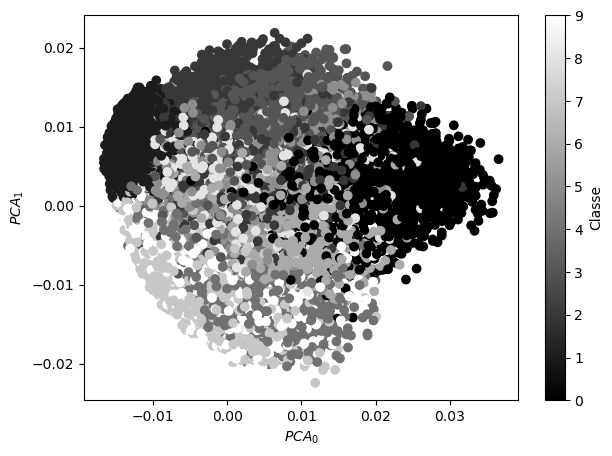

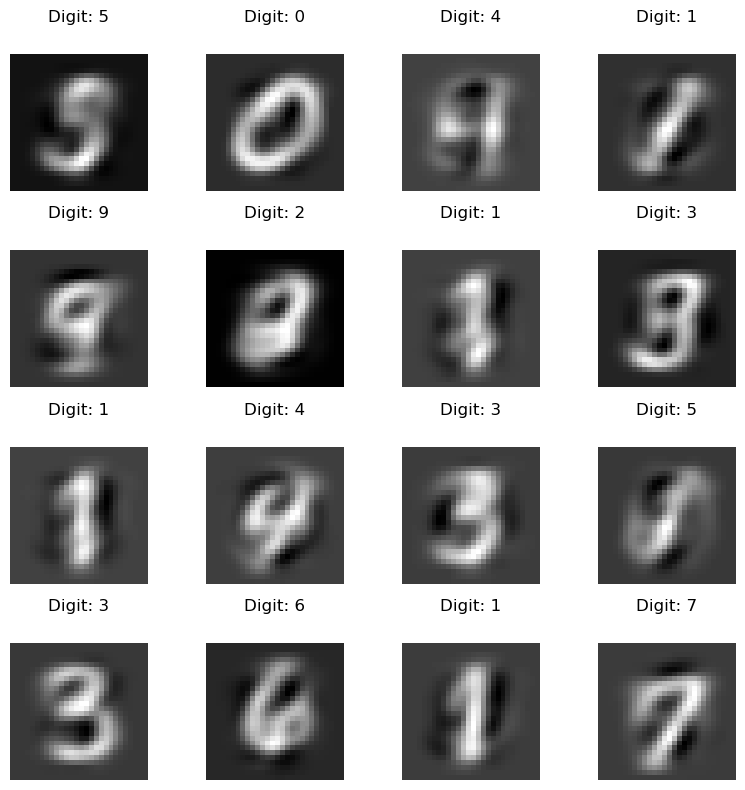

In [24]:
#@title Soluzione 2.4


# pca transformation: X -> PCA
# inverse pca transformation: PCA -> X'
# nota: X' non e' uguale a X perché parte dell'informazione e' andata perduta avendo salvato solo
# n_components della PCA e non tutte (più il numero di componenti è piccolo più la
# perdita di informazione è consistente)

# applichiamo la trasformazione solo alle prime 16 immagini
Xtransf_mnist = pca2.inverse_transform(pca2_result[:16])

# plottiamo le immagini
plt.gray()
fig = plt.figure(figsize=(8,8))

for i in range(0,16):
  ax = fig.add_subplot(4,4,i+1, title='Digit: {}'.format(str(Y_mnist[i])))
  ax.matshow(Xtransf_mnist[i].reshape(28,28).astype(float))
  plt.axis('off')
plt.tight_layout()
plt.show()

**Parte 3:**

Ripetere la parte 2 (punti 1,2,3) usando tSNE come algoritmo di rappresentazione di manifold multidimensionali (usare n_components del TSNE=2):

`from sklearn.manifold import TSNE`

NOTA: tSNE può essere molto lento se il numero di feature x numero di eventi è grande, in tal caso è possibile applicare prima una PCA che riduca le dimensioni a <=50 e poi applicare tSNE alle variabili PCA

Usare solo i primi 5000 eventi del campione MNIST e applicare tSNE, per diversi valori della perplexity: 5, 20 e 40 e confrontare i plot nello spazio tSNE0 vs tSNE1.

Usare tutti i dati ma dare in input a tSNE la pca a 50 componenti calcolata prima. Conforntare il plot con quelli precedenti.

perplexity: 2	 run time: 4.355s
perplexity: 20	 run time: 5.286s
perplexity: 40	 run time: 6.637s


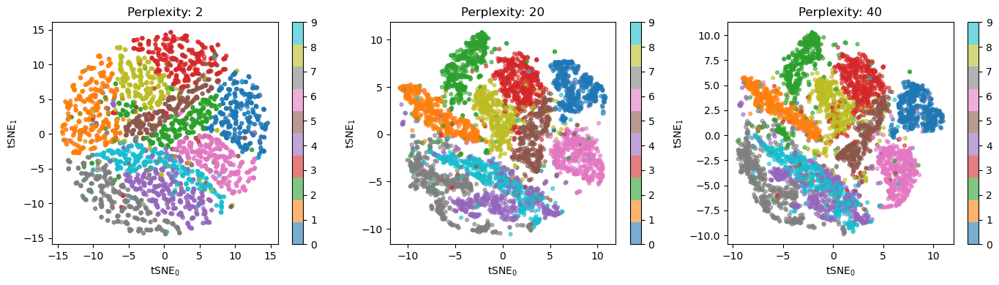

In [25]:
#code
import timeit
run_start = timeit.default_timer()

from sklearn.manifold import TSNE

fig, axs = plt.subplots(1, 3,figsize=(14,4))
perps = [2, 20, 40]

i=0
for perp in perps:
    tSNE = TSNE(2, perplexity=perp, max_iter=300, random_state=42)
    X_mnist_tsne = tSNE.fit_transform(X_mnist[:5000])

    run_end = timeit.default_timer()
    print(f'perplexity: {perp}\t run time: {(run_end-run_start):.3f}s')
    run_start = run_end

    sc = axs[i].scatter(X_mnist_tsne[:,0], X_mnist_tsne[:,1], c=Y_mnist[:5000], cmap='tab10', alpha=0.6, s=12)
    fig.colorbar(sc, ax=axs[i])
    axs[i].set_xlabel("tSNE$_0$")
    axs[i].set_ylabel("tSNE$_1$")
    axs[i].set_title(f"Perplexity: {perp}")
    i+=1

plt.tight_layout()
plt.show()

k: 3	 run time: 3.771s
k: 5	 run time: 3.050s
k: 7	 run time: 3.214s


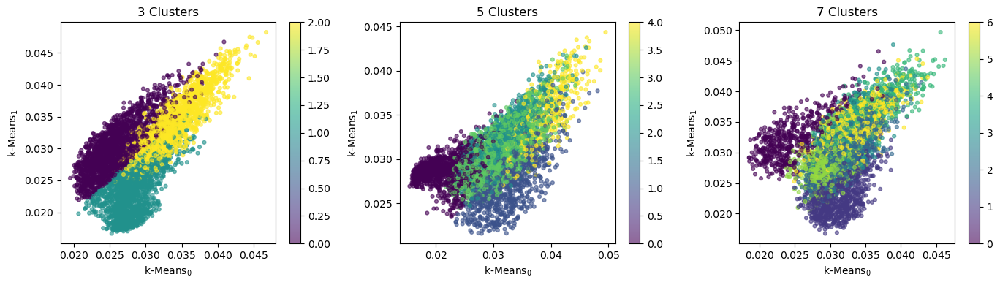

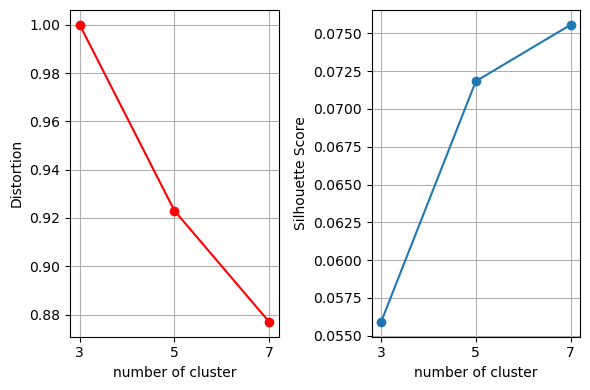

In [26]:
#code
import timeit
run_start = timeit.default_timer()

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

k_range = [3, 5, 7]
distortion = np.zeros(len(k_range))
sil_score = np.zeros(len(k_range))
fig, axs = plt.subplots(1, len(k_range), figsize=(14,4))

i=0
for k in k_range:
    kmeans = KMeans(n_clusters=k,
                   random_state=42,
                   max_iter=800, 
                   n_init=20
                  )
    
    X_mnist_kmeans = kmeans.fit_transform(X_mnist[:5000])
    distortion[i] = kmeans.inertia_
    sil_score[i] = silhouette_score(X_mnist[:5000], kmeans.labels_)

    run_end = timeit.default_timer()
    print(f'k: {k}\t run time: {(run_end-run_start):.3f}s')
    run_start = run_end

    sc = axs[i].scatter(X_mnist_kmeans[:,0], X_mnist_kmeans[:,1], c=kmeans.labels_, cmap='viridis', alpha=0.6, s=12)
    fig.colorbar(sc, ax=axs[i])
    axs[i].set_xlabel("k-Means$_0$")
    axs[i].set_ylabel("k-Means$_1$")
    axs[i].set_title(f"{k} Clusters")
    i+=1

plt.tight_layout()
plt.show()


distortion/=distortion[0]

plt.figure(figsize=(6,4))
ax = plt.subplot(1,2,1)
ax.set_xticks(k_range)
plt.plot(k_range, distortion, '-or')
plt.xlabel('number of cluster')
plt.ylabel('Distortion')
plt.grid()

ax = plt.subplot(1,2,2)
ax.set_xticks(k_range)
plt.plot(k_range, sil_score, '-o')
plt.xlabel('number of cluster')
plt.ylabel('Silhouette Score')
plt.grid()

plt.tight_layout()
plt.show()

In [ ]:
tSNE = TSNE(3, perplexity=40, n_iter=300, random_state=42, verbose=True)
X_mnist_pca_tsne =  tSNE.fit_transform(X_mnist_pca[:5000])

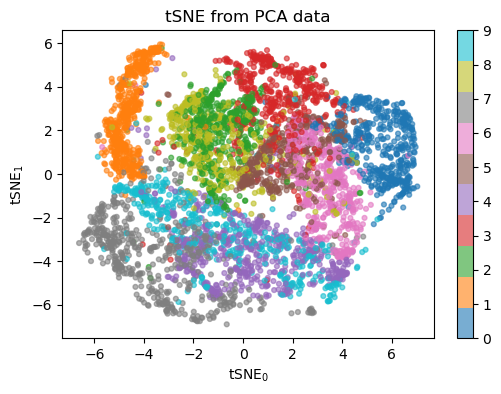

In [28]:
plt.figure(figsize=(6,4))
plt.scatter(X_mnist_pca_tsne[:,0], X_mnist_pca_tsne[:,1], c=Y_mnist[:5000], cmap='tab10', alpha=0.6, s=12)
plt.colorbar()
plt.xlabel("tSNE$_0$")
plt.ylabel("tSNE$_1$")
plt.title(f"tSNE from PCA data")
plt.show()

In [29]:
import plotly.express as px

fig = px.scatter_3d(x = X_mnist_pca_tsne[:,0], y = X_mnist_pca_tsne[:,1], z = X_mnist_pca_tsne[:,2], color=Y_mnist[:5000], color_continuous_scale=px.colors.qualitative.D3)
fig.update_traces(marker=dict(size=4))
fig.update_layout(
    autosize=False,
    width=600,
    height=500,
    margin=dict(
        l=30,
        r=30,
        b=30,
        t=30,
        pad=4
    ),
paper_bgcolor="white")

fig.show()

In [ ]:
#@title Soluzione 3A

from sklearn.manifold import TSNE
import time



# è importante testare valori della perplexity tra 5 e 50 circa e scegliuere quello che
# fornisce la migliore rappresentazione

tsne1 = TSNE(n_components=2, verbose=1, random_state=12345, perplexity=5, n_iter=300)
tsne2 = TSNE(n_components=2, verbose=1, random_state=12345, perplexity=20, n_iter=300)
tsne3 = TSNE(n_components=2, verbose=1, random_state=12345, perplexity=40, n_iter=300)


time_start = time.time()
tsne_result1 = tsne1.fit_transform(X_mnist[:5000])
tsne_result2 = tsne2.fit_transform(X_mnist[:5000])
tsne_result3 = tsne3.fit_transform(X_mnist[:5000])
print('Time elapsed: {} seconda'.format(time.time()-time_start))

plt.figure(figsize=(20,5))

ax1 = plt.subplot(1,3,1)
plt.scatter(tsne_result1[:,0], tsne_result1[:,1], c=Y_mnist[:5000], cmap='tab10')
ax1.title.set_text('perplexity=5')
cbar = plt.colorbar()
cbar.set_label('Classe')
plt.xlabel('$tSNE_0$')
plt.ylabel('$tSNE_1$')

ax2 = plt.subplot(1,3,2)
plt.scatter(tsne_result2[:,0], tsne_result2[:,1], c=Y_mnist[:5000], cmap='tab10')
ax2.title.set_text('perplexity=20')
cbar = plt.colorbar()
cbar.set_label('Classe')
plt.xlabel('$tSNE_0$')
plt.ylabel('$tSNE_1$')

ax3 = plt.subplot(1,3,3)
plt.scatter(tsne_result3[:,0], tsne_result3[:,1], c=Y_mnist[:5000], cmap='tab10')
ax3.title.set_text('perplexity=40')
cbar = plt.colorbar()
cbar.set_label('Classe')
plt.xlabel('$tSNE_0$')
plt.ylabel('$tSNE_1$')

plt.tight_layout()

In [31]:
#@title Soluzione 3B
tsne4 = TSNE(n_components=2, verbose=1, random_state=12345, perplexity=40, n_iter=300)

time_start = time.time()
tsne_result4 = tsne4.fit_transform(pca2_result)
print('Time elapsed: {} seconda'.format(time.time()-time_start))

plt.scatter(tsne_result4[:,0], tsne_result4[:,1], c=Y_mnist, cmap='tab10')
cbar = plt.colorbar()
cbar.set_label('Classe')
plt.xlabel('$tSNE_0$')
plt.ylabel('$tSNE_1$')

[t-SNE] KL divergence after 250 iterations with early exaggeration: 101.079880
[t-SNE] KL divergence after 300 iterations: 4.349338
Time elapsed: 146.01144361495972 seconda


Text(1342.9969498910673, 0.5, '$tSNE_1$')

**Parte 4:**

Ripetere la parte 2 (punti 1,2,3) usando UMAP come algoritmo di rappresentazione di manifold multidimensionali, applicarlo solo sui primi 5000 eventi MNIST e usare come input i dati mnist trasformati con PCA con 10 componenti.


```
!pip install umap-learn

import umap  # pip install umap-learn

manifold = umap.UMAP().fit(X, Y)
manifold_reduced = manifold.transform(X)

#e poi plottare manifold_reduced[:,0] vs [:,1] come fatto per PCA e tSNE

```

Quali sono le differenze?

In [ ]:
#code
try:
    import umap
except:
    !pip install umap-learn
    import umap

umap_len = 20000
pca = PCA(50)
X_mnist_pca = pca.fit_transform(X_mnist)

manifold = umap.UMAP(n_neighbors=4, random_state=42).fit(X_mnist_pca[:umap_len],Y_mnist[:umap_len])
X_mnist_umap = manifold.transform(X_mnist_pca[:umap_len])

umap.plot.points(manifold, labels=Y_mnist[:umap_len])

In [ ]:
X_mnist_inv_umap = manifold.inverse_transform(X_mnist_umap)
X_mnist_inv_pca = pca.inverse_transform(X_mnist_inv_umap)
X_mnist_inv_pca_2d = X_mnist_inv_pca.reshape(X_mnist_inv_pca.shape[0], 28, 28)

fig = plt.figure(figsize=(6, 6))
fig.suptitle("UMAP -> PCA reconstructed")
for i in range(0,16):
    plt.subplot(4,4,i+1)
    plt.imshow(X_mnist_inv_pca_2d[i], cmap='gray')
plt.tight_layout()
plt.show()

fig = plt.figure(figsize=(6, 6))
fig.suptitle("Original")
for i in range(0,16):
    plt.subplot(4,4,i+1)
    plt.imshow(X_mnist_2d[i], cmap='gray')
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier as RFC

data_len = X_mnist.shape[0]
test_perc = 0.25
X_mnist_train, X_mnist_test, Y_mnist_train, Y_mnist_test = train_test_split(X_mnist_pca[:data_len], Y_mnist[:data_len], shuffle=True, test_size=test_perc, random_state=21)
print(X_mnist_train.shape)

model = RFC(n_estimators=100,
            min_samples_leaf=2,
            random_state=42,
            )
model.fit(X_mnist_train, Y_mnist_train)

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import mean_absolute_error

Y_mnist_pred = model.predict(X_mnist_test)

MAE_test = mean_absolute_error(Y_mnist_test, Y_mnist_pred)
print("MAE Test =",MAE_test)

cm = confusion_matrix(Y_mnist_test, Y_mnist_pred, labels=model.classes_)

fig, ax = plt.subplots(figsize=(3, 3))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(ax = ax)
disp.ax_.set_title('Confusion Matrix')
disp.im_.colorbar.remove()
plt.show()

In [ ]:
#@title Soluzione 4
import umap

manifold = umap.UMAP().fit(pca2_result[:5000], Y_mnist[:5000])
X_mnist_reduced = manifold.transform(pca2_result[:5000])

plt.scatter(X_mnist_reduced[:,0], X_mnist_reduced[:,1], c=Y_mnist[:5000], cmap='tab10')
cbar = plt.colorbar()
cbar.set_label('Classe')
plt.xlabel('$UMAP_0$')
plt.ylabel('$UMAP_1$')

**Per casa:**

giocare con i vari algorimti, i parametri da cui dipendono, etc..

documentazione:

*   PCA e tSNE sul sito di [scikit-learn](https://scikit-learn.org/stable/)
*   UMAP sul sito di [umap-learn](https://umap-learn.readthedocs.io/en/latest/index.html)


